In [7]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
def pickle_load(filename):
    with open(filename, 'rb') as f:
        obj = pickle.load(f)
    return obj

from matplotlib.ticker import FuncFormatter
def format_thousands(value, pos):
    return f'{value / 1000:.0f}K'
def format_thousands2(value, pos):
    if value / 1000 < 100:
        return f'{value / 1000:.1f}K'
    else:
        return f'{value / 1000000:.2f}M'


In [ ]:
import pickle
import numpy as np

def pickle_load(filename):
    with open(filename, 'rb') as f:
        obj = pickle.load(f)
    return obj

mapper = 'jordan_wigner'
# mapper = 'bravyi_kitaev'
# mapper = 'parity'

PH_data_list = pickle_load(f'runs_final/{mapper}/PH_data.pickle') + pickle_load(f'runs_final/random/PH_data.pickle')
Tetris_data_list = pickle_load(f'runs_final/{mapper}/Tetris_data.pickle') + pickle_load(f'runs_final/random/Tetris_data.pickle')
Max_cancel_data_list = pickle_load(f'runs_final/{mapper}/Max_cancel_data.pickle') + pickle_load(f'runs_final/random/Max_cancel_data.pickle')

# PH_data_list = pickle_load(f'runs_final/PH_data.pickle')
# Tetris_data_list = pickle_load(f'runs_final/Tetris_data.pickle')
# Max_cancel_data_list = pickle_load(f'runs_final/Max_cancel_data.pickle')

# PH_data_list = pickle_load(f'runs_final/sycamore/{mapper}/PH_data.pickle') + pickle_load(f'runs_final/sycamore/random/PH_data.pickle')
# Tetris_data_list = pickle_load(f'runs_final/sycamore/{mapper}/Tetris_data.pickle') + pickle_load(f'runs_final/sycamore/random/Tetris_data.pickle')
# Max_cancel_data_list = pickle_load(f'runs_final/sycamore/{mapper}/Max_cancel_data.pickle') + pickle_load(f'runs_final/sycamore/random/Max_cancel_data.pickle')


In [ ]:
PH_qaoa = pickle_load(f'runs_final/qaoa/PH_data.pickle')


In [ ]:
from qiskit import QuantumCircuit
from qiskit import QuantumCircuit, transpile, pulse
from qiskit.providers.fake_provider import FakeManhattan
categories = []
ph_cx_cancel_ratio = []
tetris_cx_cancel_ratio = []
max_cancel_cx_cancel_ratio = []

ph_swaps = []
tetris_swaps = []
max_cancel_swaps = []

ph_cnots = []
tetris_cnots = []
max_cancel_cnots = []

ph_depth = []
tetris_depth = []
max_cancel_depth = []

backend = FakeManhattan()

for i, (ph_data, tetris_data, max_cancel_data) in enumerate(zip(PH_data_list, Tetris_data_list, Max_cancel_data_list)):
    mole, ph = ph_data
    mole, tetris = tetris_data
    mole, max_cancel = max_cancel_data
    categories.append(mole)
    
    original_cx_count = tetris['original CNOT count']
    ph_cx_cancel_ratio.append(1.0 - 1.0 * (ph['CNOT'] - ph['PH_swap_count'] * 3) / original_cx_count)
    # tetris_cx_cancel_ratio.append(1.0 - 1.0 * tetris['tetris_cx_count'] / original_cx_count)
    tetris_cx_cancel_ratio.append(1.0 - 1.0 * (tetris['CNOT'] - tetris['tetris_swap_count'] * 3) / original_cx_count)
    max_cancel_cx_cancel_ratio.append(1.0 - 1.0 * (max_cancel['CNOT'] - max_cancel['tetris_swap_count'] * 3) / original_cx_count)
    
    ph['CX_cancel_ratio'] = 1.0 - 1.0 * (ph['CNOT'] - ph['PH_swap_count'] * 3) / original_cx_count
    tetris['CX_cancel_ratio'] = 1.0 - 1.0 * (tetris['CNOT'] - tetris['tetris_swap_count'] * 3) / original_cx_count
    max_cancel['CX_cancel_ratio'] = 1.0 - 1.0 * (max_cancel['CNOT'] - max_cancel['tetris_swap_count'] * 3) / original_cx_count
    
    ph['Swap_insertion'] = ph['PH_swap_count']
    tetris['Swap_insertion'] = tetris['tetris_swap_count']
    max_cancel['Swap_insertion'] = max_cancel['tetris_swap_count']
    
    ph_swaps.append(ph['PH_swap_count'])
    tetris_swaps.append(tetris['tetris_swap_count'])
    max_cancel_swaps.append(max_cancel['tetris_swap_count'])
    
    ph_cnots.append(ph['CNOT'])
    tetris_cnots.append(tetris['CNOT'])
    max_cancel_cnots.append(max_cancel['CNOT'])
    
    ph_depth.append(ph['Depth'])
    tetris_depth.append(tetris['Depth'])
    max_cancel_depth.append(max_cancel['Depth'])
    

In [ ]:
rows = ['random_graph10_0.1_0.txt', 'random_graph10_0.1_1.txt', 'random_graph10_0.1_2.txt', 'random_graph10_0.1_3.txt', 'random_graph10_0.1_4.txt', 'random_graph10_0.2_0.txt', 'random_graph10_0.2_1.txt', 'random_graph10_0.2_2.txt', 'random_graph10_0.2_3.txt', 'random_graph10_0.2_4.txt', 'random_graph10_0.3_0.txt', 'random_graph10_0.3_1.txt', 'random_graph10_0.3_2.txt', 'random_graph10_0.3_3.txt', 'random_graph10_0.3_4.txt', 'random_graph12_0.1_0.txt', 'random_graph12_0.1_1.txt', 'random_graph12_0.1_2.txt', 'random_graph12_0.1_3.txt', 'random_graph12_0.1_4.txt', 'random_graph12_0.2_0.txt', 'random_graph12_0.2_1.txt', 'random_graph12_0.2_2.txt', 'random_graph12_0.2_3.txt', 'random_graph12_0.2_4.txt', 'random_graph12_0.3_0.txt', 'random_graph12_0.3_1.txt', 'random_graph12_0.3_2.txt', 'random_graph12_0.3_3.txt', 'random_graph12_0.3_4.txt', 'random_graph14_0.1_0.txt', 'random_graph14_0.1_1.txt', 'random_graph14_0.1_2.txt', 'random_graph14_0.1_3.txt', 'random_graph14_0.1_4.txt', 'random_graph14_0.2_0.txt', 'random_graph14_0.2_1.txt', 'random_graph14_0.2_2.txt', 'random_graph14_0.2_3.txt', 'random_graph14_0.2_4.txt', 'random_graph14_0.3_0.txt', 'random_graph14_0.3_1.txt', 'random_graph14_0.3_2.txt', 'random_graph14_0.3_3.txt', 'random_graph14_0.3_4.txt', 'random_graph16_0.1_0.txt', 'random_graph16_0.1_1.txt', 'random_graph16_0.1_2.txt', 'random_graph16_0.1_3.txt', 'random_graph16_0.1_4.txt', 'random_graph16_0.2_0.txt', 'random_graph16_0.2_1.txt', 'random_graph16_0.2_2.txt', 'random_graph16_0.2_3.txt', 'random_graph16_0.2_4.txt', 'random_graph16_0.3_0.txt', 'random_graph16_0.3_1.txt', 'random_graph16_0.3_2.txt', 'random_graph16_0.3_3.txt', 'random_graph16_0.3_4.txt', 'random_graph18_0.1_0.txt', 'random_graph18_0.1_1.txt', 'random_graph18_0.1_2.txt', 'random_graph18_0.1_3.txt', 'random_graph18_0.1_4.txt', 'random_graph18_0.2_0.txt', 'random_graph18_0.2_1.txt', 'random_graph18_0.2_2.txt', 'random_graph18_0.2_3.txt', 'random_graph18_0.2_4.txt', 'random_graph18_0.3_0.txt', 'random_graph18_0.3_1.txt', 'random_graph18_0.3_2.txt', 'random_graph18_0.3_3.txt', 'random_graph18_0.3_4.txt', 'random_graph20_0.1_0.txt', 'random_graph20_0.1_1.txt', 'random_graph20_0.1_2.txt', 'random_graph20_0.1_3.txt', 'random_graph20_0.1_4.txt', 'random_graph20_0.2_0.txt', 'random_graph20_0.2_1.txt', 'random_graph20_0.2_2.txt', 'random_graph20_0.2_3.txt', 'random_graph20_0.2_4.txt', 'random_graph20_0.3_0.txt', 'random_graph20_0.3_1.txt', 'random_graph20_0.3_2.txt', 'random_graph20_0.3_3.txt', 'random_graph20_0.3_4.txt', 'regular_graph10_3_0.txt', 'regular_graph10_3_1.txt', 'regular_graph10_3_2.txt', 'regular_graph10_3_3.txt', 'regular_graph10_3_4.txt', 'regular_graph12_3_0.txt', 'regular_graph12_3_1.txt', 'regular_graph12_3_2.txt', 'regular_graph12_3_3.txt', 'regular_graph12_3_4.txt', 'regular_graph14_3_0.txt', 'regular_graph14_3_1.txt', 'regular_graph14_3_2.txt', 'regular_graph14_3_3.txt', 'regular_graph14_3_4.txt', 'regular_graph16_3_0.txt', 'regular_graph16_3_1.txt', 'regular_graph16_3_2.txt', 'regular_graph16_3_3.txt', 'regular_graph16_3_4.txt', 'regular_graph18_3_0.txt', 'regular_graph18_3_1.txt', 'regular_graph18_3_2.txt', 'regular_graph18_3_3.txt', 'regular_graph18_3_4.txt', 'regular_graph20_3_0.txt', 'regular_graph20_3_1.txt', 'regular_graph20_3_2.txt', 'regular_graph20_3_3.txt', 'regular_graph20_3_4.txt']
for row in rows:
    for filename, dic in PH_qaoa:
        if filename == row:
            # print(filename)
            # print(dic['PH_swap_count'])
            # print(dic['CNOT'])
            # print(dic['Depth'])
            break

ESP Analysis

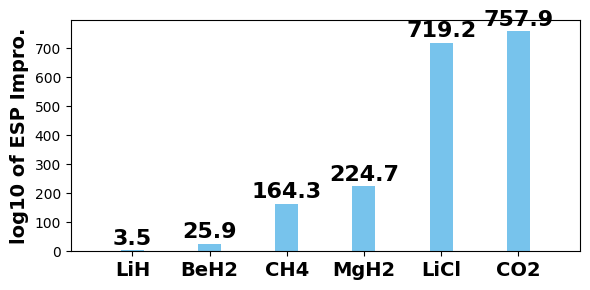

In [ ]:
benchmarks = ['LiH', 'BeH2', 'CH4', 'MgH2', 'LiCl', 'CO2']#, 'Random10', 'Random15', 'Random20', 'Random25', 'Random30', 'Random35']
experiments = ['Paulihedral', 'Tetris']
Tetris_data_list = pickle_load(f'runs_final/jordan_wigner/Tetris_lookahead_data.pickle')
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(6, 3))

bar_width = 0.3
x = np.arange(len(benchmarks))

colors = ['#5ba585', '#30655f', '#e0e7c8']
colors1 = ['#5ba585', '#30655f', '#e0e7c8']
data = []
for i, benchmark in enumerate(benchmarks):
    bars = Tetris_data_list[i][1]['ESP_imp']
    data.append(bars)
data = np.array(data)
ax.bar(x, data, width=bar_width, label='log10 ESP improvement', color='#77C3EC')
for i, pos in enumerate(x):
    ax.text(pos, data[i] + 5, '{:.1f}'.format(data[i]), ha='center', va='bottom', fontsize=16, weight='bold')

ax.hlines(y=0, xmin=-0.5, xmax=5.5, linewidth=.5, color='black')

ax.set_xticks(x)
ax.set_xticklabels(benchmarks, fontsize=14, fontweight='bold')  # Set font size for x-axis tick labels

ax.set_ylabel('log10 of ESP Impro.', fontsize=14, fontweight='bold')
# ax.set_xticks(np.arange(len(benchmarks)) + bar_width * (len(experiments) - 1) / 2)
ax.set_xticklabels(benchmarks)
# ax.legend()
# ax.set_title('ESP improvement across Benchmarks')

plt.tight_layout()

# Save the figure as PDF
plt.savefig('ESP_Analysis.pdf')
plt.show()


Scalability

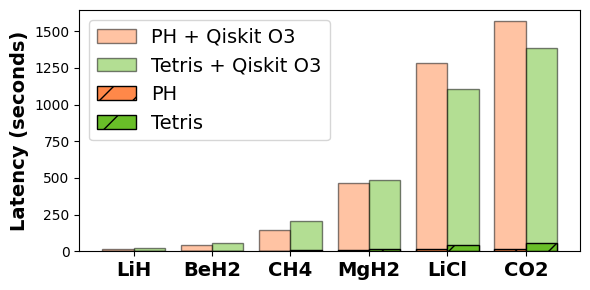

In [ ]:
benchmarks = ['LiH', 'BeH2', 'CH4', 'MgH2', 'LiCl', 'CO2']#, 'Random10', 'Random15', 'Random20', 'Random25', 'Random30', 'Random35']
experiments = ['PH', 'Tetris', 'GCO Tetris']

PH_data_list = pickle_load(f'runs_final/jordan_wigner/PH_data.pickle')
Tetris_data_list = pickle_load(f'runs_final/jordan_wigner/Tetris_data.pickle')
Tetris_lookahead_data_list = pickle_load(f'runs_final/jordan_wigner/Tetris_lookahead_data.pickle')

def get_metric_data(metric_name):
    data = []
    for i, benchmark in enumerate(benchmarks):
        bars = []
        for data_list in [PH_data_list, Tetris_lookahead_data_list, Tetris_data_list]:
            bars.append(data_list[i][1][metric_name])
        data.append(bars)
    return np.array(data)

data1 = get_metric_data('latency1')
data2 = get_metric_data('latency2')
data = data1 + data2

width = 0.4
colors2 = ['#FF8849', '#69BE28', '#3DB7E4']
fig, ax = plt.subplots(figsize=(6, 3))
ax.bar(np.array(range(len(benchmarks))) - width * 0.5, data[:, 0], width, color=colors2[0], edgecolor='black', alpha=0.5, label=f'{experiments[0]} + Qiskit O3')
ax.bar(np.array(range(len(benchmarks))) + width * 0.5, data[:, 1], width, color=colors2[1], edgecolor='black', alpha=0.5, label=f'{experiments[1]} + Qiskit O3')
# ax.bar(np.array(range(len(benchmarks))) + width, data[:, 2], width, color=colors2[2], edgecolor='black', alpha=0.5, label=f'{experiments[2]} + Qiskit O3')
ax.bar(np.array(range(len(benchmarks))) - width * 0.5, data1[:, 0], width, color=colors2[0], edgecolor='black', hatch='/', label=f'{experiments[0]}')
ax.bar(np.array(range(len(benchmarks))) + width * 0.5, data1[:, 1], width, color=colors2[1], edgecolor='black', hatch='/', label=f'{experiments[1]}')
# ax.bar(np.array(range(len(benchmarks))) + width, data1[:, 2], width, color=colors2[2], edgecolor='black', hatch='/', label=f'{experiments[2]}')
    # ax.plot(benchmarks, data[:, j], label=experiment, marker='o', color=colors2[j])

# ax.set_xlabel('Benchmarks')
ax.set_ylabel('Latency (seconds)', fontsize=14, fontweight='bold')
ax.legend(fontsize=14)
# ax.set_title('Scalability Analysis')
ax.set_xticks(ticks=x)
ax.set_xticklabels(benchmarks, fontsize=14, fontweight='bold')  # Set font size for x-axis tick labels

plt.tight_layout()

# Save the figure as PDF
plt.savefig('scalability_analysis.pdf')
plt.show()


In [ ]:
# PH_data_list = pickle_load(f'runs_final/jordan_wigner/PH_data.pickle')# + pickle_load(f'runs_final/bravyi_kitaev/PH_data.pickle')
PH_data_list = pickle_load(f'runs_final/bravyi_kitaev/PH_data.pickle')
Tetris_data_list = pickle_load(f'runs_final/random/Tetris_lookahead_data.pickle')
benchmarks = ['LiH', 'BeH2', 'CH4', 'MgH2', 'LiCl', 'CO2']
# benchmarks = ['Random10', 'Random15', 'Random20', 'Random25', 'Random30', 'Random35']
def get_metric_data(metric_name):
    data = []
    for i, benchmark in enumerate(benchmarks):
        bars = []
        for data_list in [Tetris_data_list]:
            bars.append(data_list[i][1][metric_name])
        data.append(bars)
    return np.array(data)

data = get_metric_data('duration')
for i in data:
    print("{:.1f}M".format(i[0]/1000000))

8.6M
20.1M
38.4M
64.5M
97.3M
132.2M


Sycamore result

[330, 741, 2643, 2625, 2907, 4299]
[6356, 15875, 55730, 91939, 188541, 222820]


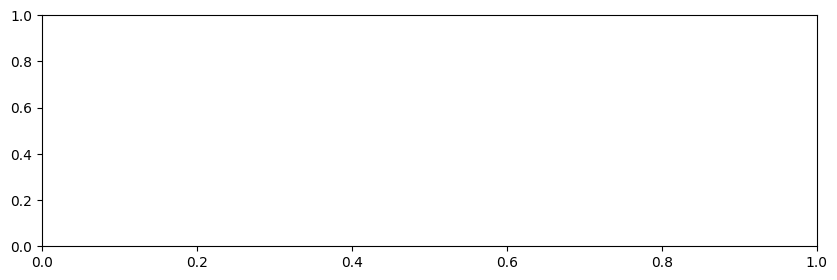

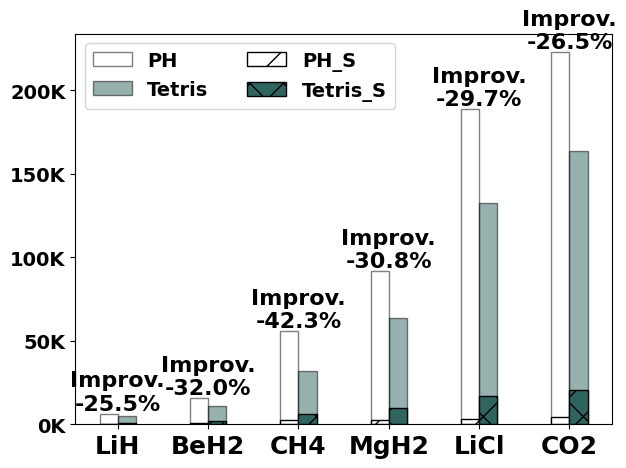

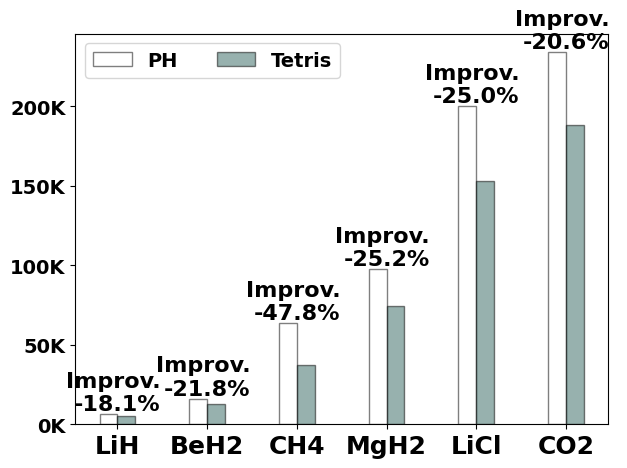

In [ ]:
from matplotlib.ticker import FuncFormatter
def format_thousands(value, pos):
    return f'{value / 1000:.0f}K'
def format_thousands2(value, pos):
    if value / 1000 < 100:
        return f'{value / 1000:.1f}K'
    else:
        return f'{value / 1000000:.2f}M'

def pickle_load(filename):
    with open(filename, 'rb') as f:
        obj = pickle.load(f)
    return obj

show_imp = True

PH_data_list = pickle_load(f'runs_final/sycamore/jordan_wigner/PH_data.pickle')# + pickle_load(f'runs_final/sycamore/random/PH_data.pickle')
Tetris_data_list = pickle_load(f'runs_final/sycamore/jordan_wigner/Tetris_lookahead_data.pickle')# + pickle_load(f'runs_final/sycamore/random/Tetris_lookahead_data.pickle')
fig, ax = plt.subplots(figsize=(10, 3))

def get_metric_data(metric_name):
    data = []
    for i, benchmark in enumerate(benchmarks):
        bars = []
        for data_list in [PH_data_list, Tetris_data_list]:
            bars.append(data_list[i][1][metric_name])
        data.append(bars)
    return np.array(data)

x_values = np.array(['LiH', 'BeH2', 'CH4', 'MgH2', 'LiCl', 'CO2'])  # X-axis values
# benchmarks = x_values
ph_s = []
tetris_s = []
for i in range(6):
    ph_s.append(PH_data_list[i][1]['PH_swap_count'] * 3)
    tetris_s.append(Tetris_data_list[i][1]['tetris_swap_count'] * 3)

ph_depth = []
tetris_depth = []
for i in range(6):
    ph_depth.append(PH_data_list[i][1]['Depth'])
    tetris_depth.append(Tetris_data_list[i][1]['Depth'])

print(ph_s)

ph = []
tetris = []
for i in range(6):
    ph.append(PH_data_list[i][1]['CNOT'])
    tetris.append(Tetris_data_list[i][1]['CNOT'])

print(ph)

width = 0.2  # Width of each bar

# Create a figure and axis
fig, ax = plt.subplots()

# Set the bar positions
x_positions = np.arange(len(x_values))

# Create the bars
# Custom colors for bars (in hexadecimal format)
colors = ['#5ba585', '#30655f', '#e0e7c8']
colors1 = ['#5ba585', '#30655f', '#e0e7c8']

bar1_plot = ax.bar(x_positions - width/2, ph, width, label='PH',color='w',edgecolor='black',alpha=0.5)
bar2_plot = ax.bar(x_positions + width/2, tetris, width, label='Tetris',color=colors[1],edgecolor='black',alpha=0.5)

bar4_plot = ax.bar(x_positions - width/2, ph_s, width, label='PH_S',color='w',edgecolor='black', hatch='/')
bar5_plot = ax.bar(x_positions + width/2, tetris_s, width, label='Tetris_S',color=colors1[1],edgecolor='black',hatch='x')
if show_imp:
    for i, pos in enumerate(x_positions):
        ax.text(pos, ph[i] + 5, 'Improv.\n{:.1f}%'.format((tetris[i] - ph[i]) * 100 / ph[i]), ha='center', va='bottom', fontsize=16, weight='bold')
plt.gca().yaxis.set_major_formatter(FuncFormatter(format_thousands))

# Set the x-axis labels
ax.set_xticks(x_positions)
ax.set_xticklabels(x_values, fontsize=18,fontweight='bold')  # Set font size for x-axis tick labels

# Set the y-axis label font size
# ax.set_ylabel('Values', fontsize=14,fontweight='bold')  # Set font size for y-axis label

# Set the x-axis label font size
# ax.set_xlabel('X-Axis', fontsize=14,fontweight='bold')  # Set font size for x-axis label

# Set font size for y-axis tick labels
ax.tick_params(axis='y', labelsize=14)
ytick_labels = ax.get_yticklabels()
for label in ytick_labels:
    label.set_fontweight('bold')
# Add labels and a legend
# ax.set_yscale('log')
# ax.set_ylim(0, 1)
# ax.set_xlabel('Real Molecules with BK')
# ax.set_xlabel('Real Molecules with JW')

# ax.set_ylabel('Total CNOT Gate Count')
# ax.set_ylabel('')

# ax.set_title('CX Gate Cancel Ratio',fontsize = 15)
# ax.legend(fontsize=10,ncol=2)
legend = plt.legend(fontsize=14,ncol=2)
for text in legend.get_texts():
    text.set_fontweight('bold')
# Show the plot
plt.tight_layout()
plt.savefig('exp_figs/cnot_w_breakdown_sycamore_jw.pdf')
# plt.savefig('exp_figs/cnot_w_breakdown_molecule_bk.pdf')

plt.show()



width = 0.2  # Width of each bar

# Create a figure and axis
fig, ax = plt.subplots()

# Set the bar positions
x_positions = np.arange(len(x_values))

# Create the bars
# Custom colors for bars (in hexadecimal format)
colors = ['#5ba585', '#30655f', '#e0e7c8']
colors1 = ['#5ba585', '#30655f', '#e0e7c8']

bar1_plot = ax.bar(x_positions - width/2, ph_depth, width, label='PH',color='w',edgecolor='black',alpha=0.5)
bar2_plot = ax.bar(x_positions + width/2, tetris_depth, width, label='Tetris',color=colors[1],edgecolor='black',alpha=0.5)

# bar4_plot = ax.bar(x_positions - width/2, ph_s, width, label='PH_S',color='w',edgecolor='black', hatch='/')
# bar5_plot = ax.bar(x_positions + width/2, tetris_s, width, label='Tetris_S',color=colors1[1],edgecolor='black',hatch='x')
if show_imp:
    for i, pos in enumerate(x_positions):
        ax.text(pos, ph_depth[i] + 5, 'Improv. \n{:.1f}%'.format((tetris_depth[i] - ph_depth[i]) * 100 / ph[i]), ha='center', va='bottom', fontsize=16, weight='bold')

plt.gca().yaxis.set_major_formatter(FuncFormatter(format_thousands))

# Set the x-axis labels
ax.set_xticks(x_positions)
ax.set_xticklabels(x_values, fontsize=18,fontweight='bold')  # Set font size for x-axis tick labels

# Set the y-axis label font size
# ax.set_ylabel('Values', fontsize=14,fontweight='bold')  # Set font size for y-axis label

# Set the x-axis label font size
# ax.set_xlabel('X-Axis', fontsize=14,fontweight='bold')  # Set font size for x-axis label

# Set font size for y-axis tick labels
ax.tick_params(axis='y', labelsize=14)
ytick_labels = ax.get_yticklabels()
for label in ytick_labels:
    label.set_fontweight('bold')
# Add labels and a legend
# ax.set_yscale('log')
# ax.set_ylim(0, 1)
# ax.set_xlabel('Real Molecules with BK')
# ax.set_xlabel('Real Molecules with JW')

# ax.set_ylabel('Circuit Depth')
# ax.set_ylabel('')

# ax.set_title('CX Gate Cancel Ratio',fontsize = 15)
# ax.legend(fontsize=10,ncol=2)
legend = plt.legend(fontsize=14,ncol=2)
for text in legend.get_texts():
    text.set_fontweight('bold')
# Show the plot
plt.tight_layout()
plt.savefig('exp_figs/depth_sycamore_jw.pdf')
# plt.savefig('exp_figs/cnot_w_breakdown_molecule_bk.pdf')

plt.show()


# Ablation Study


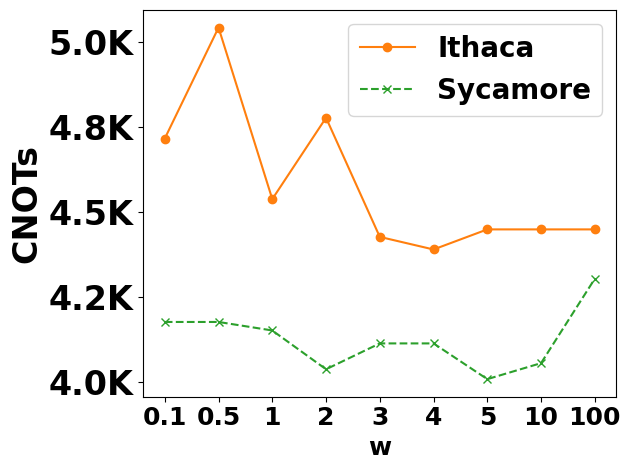

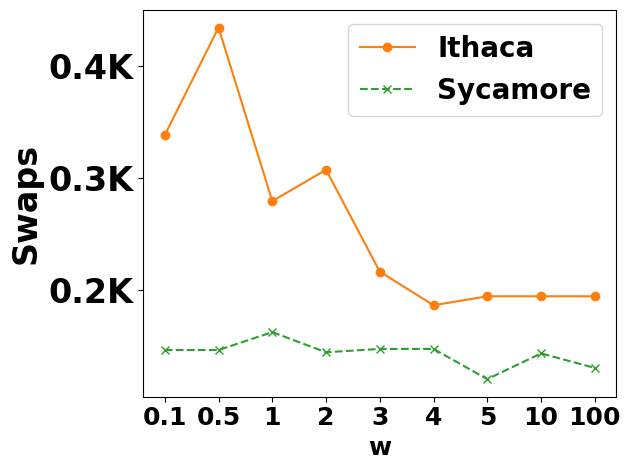

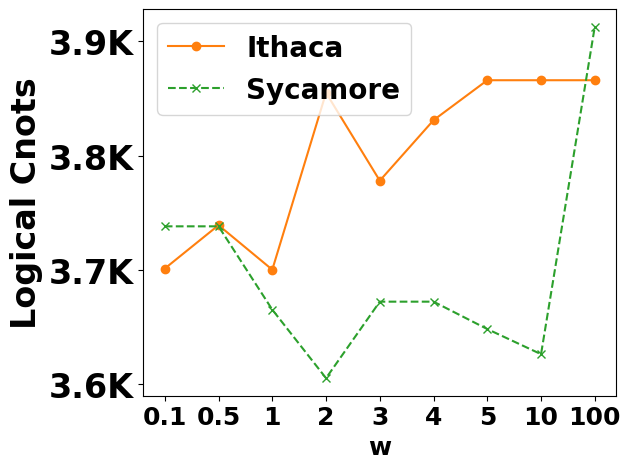

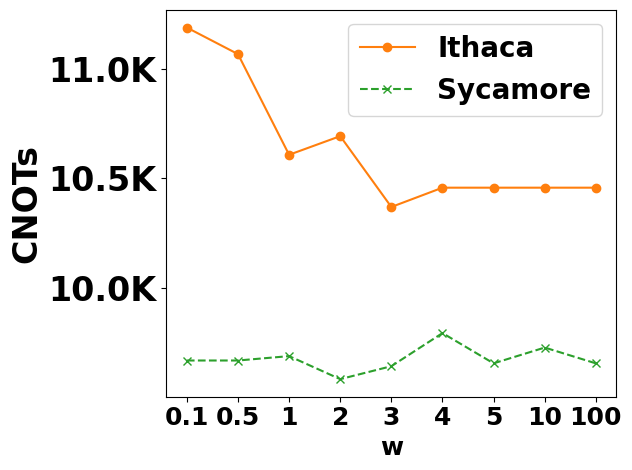

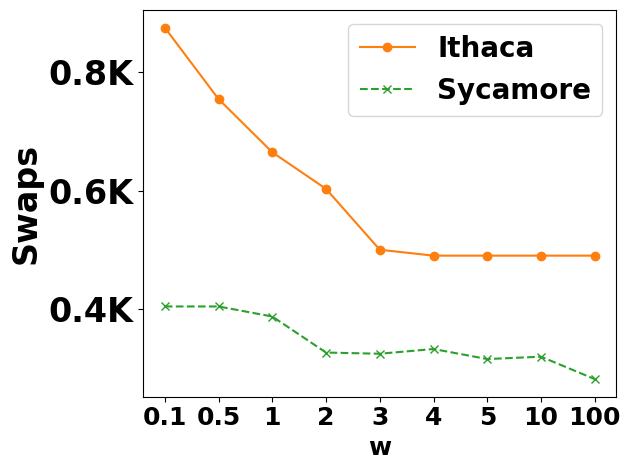

...

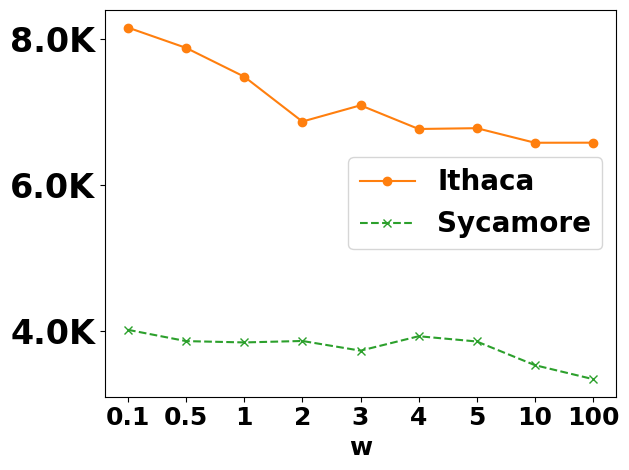

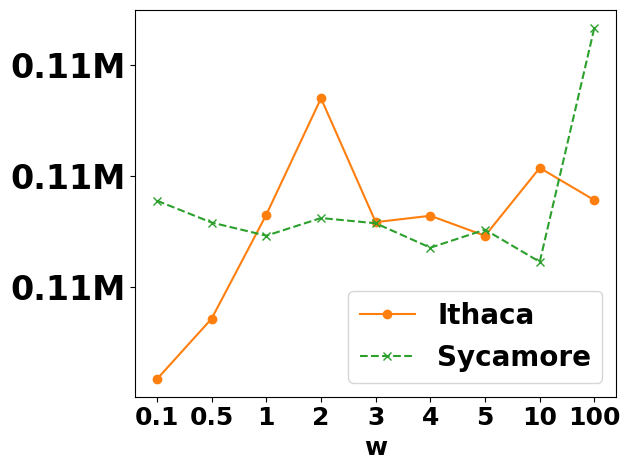

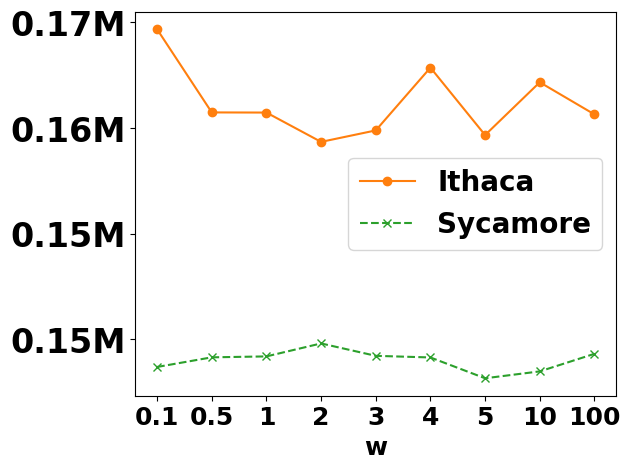

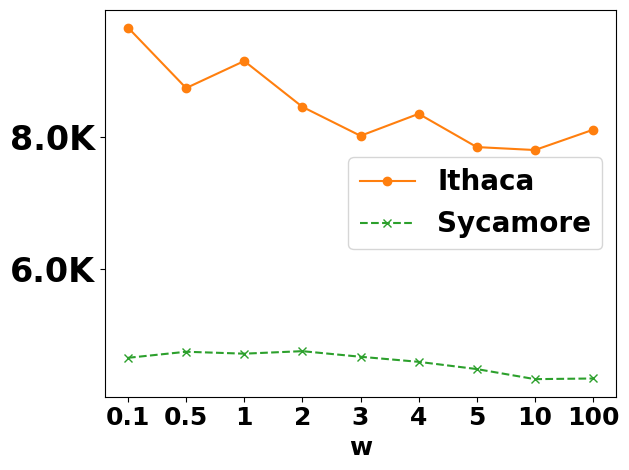

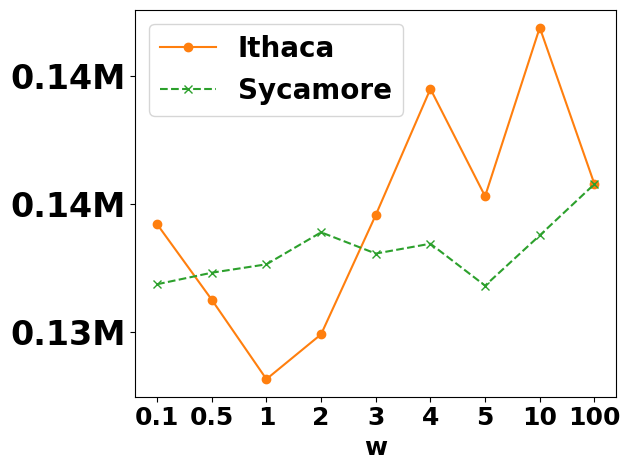

In [ ]:
ws = [0.1, 0.5, 1, 2, 3, 4, 5, 10, 100]
ithaca_cnots = [0 for w in ws]
ithaca_depth = [0 for w in ws]
ithaca_swaps = [0 for w in ws]
ithaca_lcnots = [0 for w in ws]
sycamore_cnots = [0 for w in ws]
sycamore_depth = [0 for w in ws]
sycamore_swaps = [0 for w in ws]
sycamore_lcnots = [0 for w in ws]

for bid in range(6):
    for i, w in enumerate(ws):
        # ithaca_data = pickle_load(f'runs_final/ablation/ithaca_w_{w}.pickle')
        # sycamore_data = pickle_load(f'runs_final/ablation/sycamore_w_{w}.pickle')
        # ithaca_cnots[i] = ithaca_data[bid][1]['CNOT']
        # ithaca_depth[i] = ithaca_data[bid][1]['Depth']
        # ithaca_swaps[i] = ithaca_data[bid][1]['tetris_swap_count']
        # ithaca_lcnots[i] = ithaca_cnots[i] - 3 * ithaca_swaps[i]
        # sycamore_cnots[i] = sycamore_data[bid][1]['CNOT']
        # sycamore_depth[i] = sycamore_data[bid][1]['Depth']
        # sycamore_swaps[i] = sycamore_data[bid][1]['tetris_swap_count']
        # sycamore_lcnots[i] = sycamore_cnots[i] - 3 * sycamore_swaps[i]
        pass
    ithaca_data = pickle_load(f'runs_final/ablation/ithaca_mole{bid}_different_w.pickle')
    sycamore_data = pickle_load(f'runs_final/ablation/sycamore_mole{bid}_different_w.pickle')
    for i, w in enumerate(ws):
        ithaca_cnots[i] = ithaca_data[i][1]['CNOT']
        ithaca_depth[i] = ithaca_data[i][1]['Depth']
        ithaca_swaps[i] = ithaca_data[i][1]['tetris_swap_count']
        ithaca_lcnots[i] = ithaca_cnots[i] - 3 * ithaca_swaps[i]
        sycamore_cnots[i] = sycamore_data[i][1]['CNOT']
        sycamore_depth[i] = sycamore_data[i][1]['Depth']
        sycamore_swaps[i] = sycamore_data[i][1]['tetris_swap_count']
        sycamore_lcnots[i] = sycamore_cnots[i] - 3 * sycamore_swaps[i]


    fig, ax1 = plt.subplots()

    color = 'tab:orange'
    ax1.set_xlabel('w', fontsize=18, fontweight='bold')
    if bid < 3:
        ax1.set_ylabel('CNOTs', color='black', fontsize=24, fontweight='bold')
    ax1.plot(range(len(ws)), ithaca_cnots, color=color, label='Ithaca', linestyle='-', marker='o')

    color = 'tab:green'
    ax1.plot(range(len(ws)), sycamore_cnots, color=color, label='Sycamore', linestyle='--', marker='x')
    ax1.tick_params(axis='y', labelcolor='black', labelsize=24)
    plt.gca().yaxis.set_major_formatter(FuncFormatter(format_thousands2))
    # Set x-axis ticks at equally spaced intervals
    ax1.set_xticks(range(len(ws)))
    ax1.set_xticklabels([str(w) for w in ws], fontsize=18, fontweight='bold')
    legend = plt.legend(fontsize=20)
    for text in legend.get_texts():
        text.set_fontweight('bold')

    ytick_labels = ax1.get_yticklabels()
    for label in ytick_labels:
        label.set_fontweight('bold')
    fig.tight_layout()  
    # plt.title('Ithaca CNOT and Depth')
    plt.savefig(f'exp_figs/mole{bid}_cnots_w.pdf')
    plt.show()

    # Plotting the second figure for Sycamore
    fig, ax1 = plt.subplots()

    color = 'tab:orange'
    ax1.set_xlabel('w', fontsize=18, fontweight='bold')
    if bid < 3:
        ax1.set_ylabel('Swaps', color='black', fontsize=24, fontweight='bold')
    ax1.plot(range(len(ws)), ithaca_swaps, color=color, label='Ithaca', linestyle='-', marker='o')

    # ax2 = ax1.twinx()  
    color = 'tab:green'
    ax1.plot(range(len(ws)), sycamore_swaps, color=color, label='Sycamore', linestyle='--', marker='x')
    ax1.tick_params(axis='y', labelcolor='black', labelsize=24)
    plt.gca().yaxis.set_major_formatter(FuncFormatter(format_thousands2))
    # Set x-axis ticks at equally spaced intervals
    ax1.set_xticks(range(len(ws)))
    ax1.set_xticklabels([str(w) for w in ws], fontsize=18, fontweight='bold')

    legend = plt.legend(fontsize=20)
    for text in legend.get_texts():
        text.set_fontweight('bold')
    ytick_labels = ax1.get_yticklabels()
    for label in ytick_labels:
        label.set_fontweight('bold')
    fig.tight_layout()  
    # plt.title('Sycamore CNOT and Depth')
    plt.savefig(f'exp_figs/mole{bid}_swaps_w.pdf')
    plt.show()
    # Plotting the second figure for Sycamore
    fig, ax1 = plt.subplots()

    color = 'tab:orange'
    ax1.set_xlabel('w', fontsize=18, fontweight='bold')
    if bid < 3:
        ax1.set_ylabel('Logical Cnots', color='black', fontsize=24, fontweight='bold')
    ax1.plot(range(len(ws)), ithaca_lcnots, color=color, label='Ithaca', linestyle='-', marker='o')

    # ax2 = ax1.twinx()  
    color = 'tab:green'
    ax1.plot(range(len(ws)), sycamore_lcnots, color=color, label='Sycamore', linestyle='--', marker='x')
    ax1.tick_params(axis='y', labelcolor='black', labelsize=24)
    plt.gca().yaxis.set_major_formatter(FuncFormatter(format_thousands2))
    # Set x-axis ticks at equally spaced intervals
    ax1.set_xticks(range(len(ws)))
    ax1.set_xticklabels([str(w) for w in ws], fontsize=18, fontweight='bold')

    legend = plt.legend(fontsize=20)
    for text in legend.get_texts():
        text.set_fontweight('bold')

    ytick_labels = ax1.get_yticklabels()
    for label in ytick_labels:
        label.set_fontweight('bold')
    fig.tight_layout()  
    # plt.title('Sycamore CNOT and Depth')
    plt.savefig(f'exp_figs/mole{bid}_logical_cnots_w.pdf')
    plt.show()

[0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0]
[0.4945406913757324, 0.6502995491027832, 0.8099038600921631, 0.9634497165679932, 1.247422456741333, 1.2687747478485107, 1.4873278141021729, 1.647707223892212]
[20.44307255744934, 21.57291078567505, 21.03291654586792, 23.75176167488098, 26.521338939666748, 22.806033611297607, 23.29857087135315, 21.52757453918457]


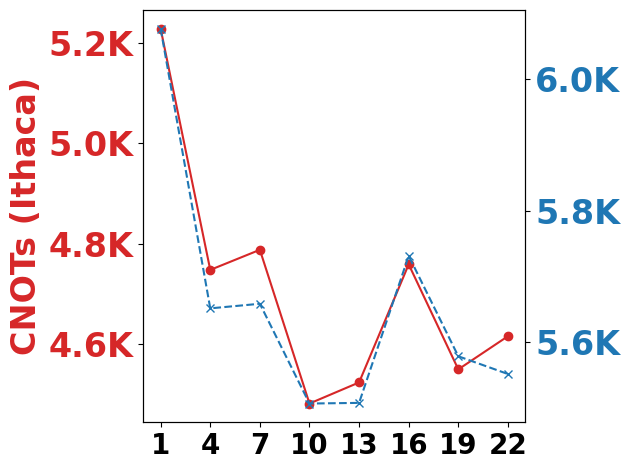

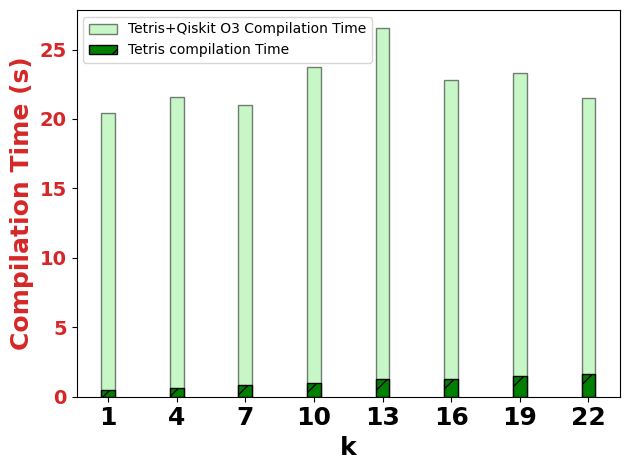

[1.2545020580291748, 1.6723556518554688, 2.2165749073028564, 2.4726297855377197, 3.3750033378601074, 3.1152656078338623, 3.5124921798706055, 4.23310923576355]
[67.0092990398407, 58.41897249221802, 59.52071499824524, 57.47311472892761, 64.02189803123474, 48.504555225372314, 64.8286349773407, 65.26442360877991]


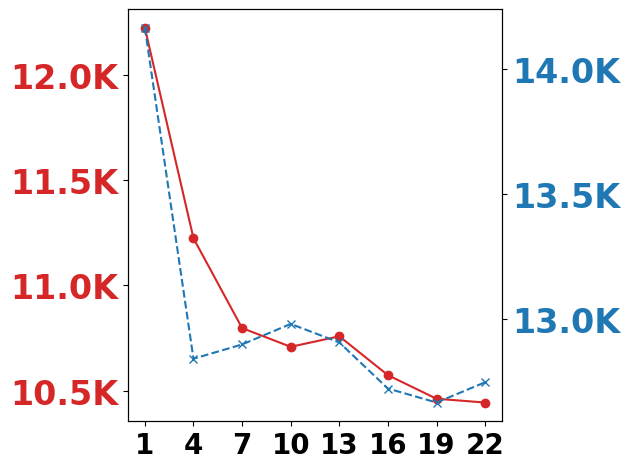

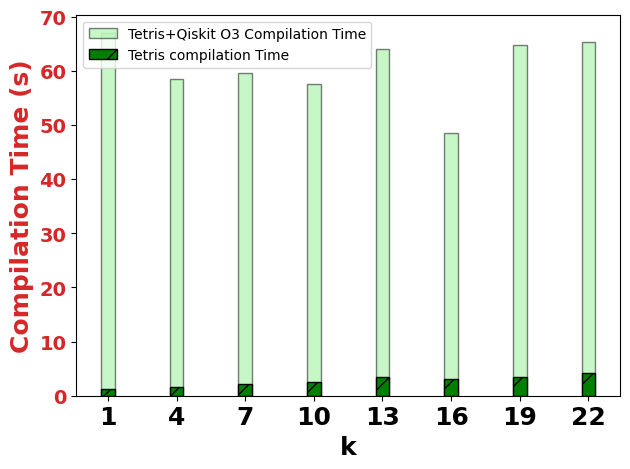

[3.731083869934082, 5.07389235496521, 7.31237530708313, 8.539400815963745, 9.22065806388855, 10.483350992202759, 12.015037298202515, 14.550107479095459]
[225.7968726158142, 203.28307056427002, 216.2453510761261, 204.18772888183594, 191.4632465839386, 203.63161063194275, 221.1940357685089, 204.99246168136597]


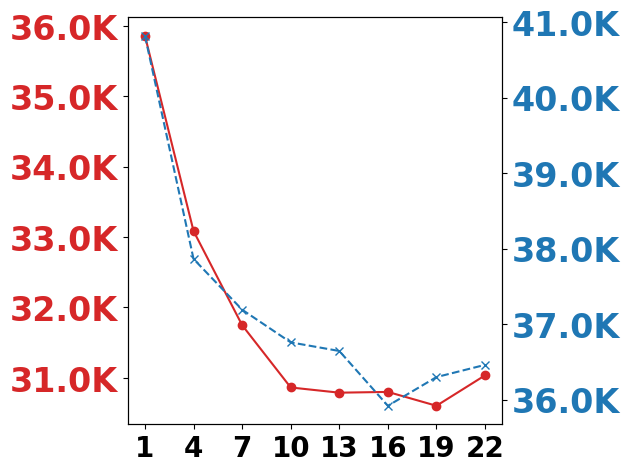

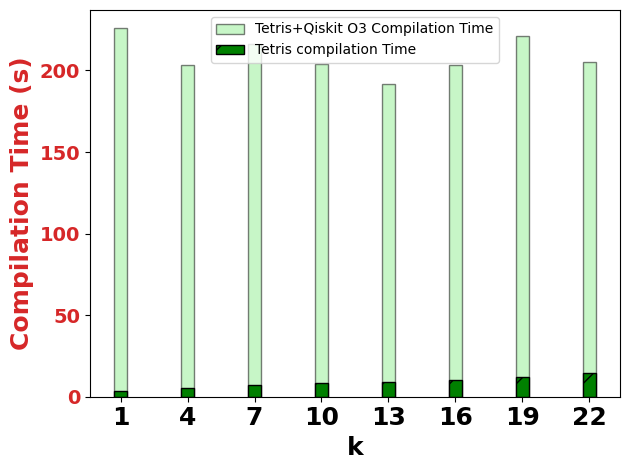

[9.017641544342041, 11.333021640777588, 15.755057334899902, 17.46660852432251, 20.538341999053955, 23.40436863899231, 27.063705921173096, 30.34208083152771]
[535.7023804187775, 507.5082938671112, 466.9710531234741, 466.9254593849182, 489.84579825401306, 477.7178568840027, 477.07536149024963, 482.75587487220764]


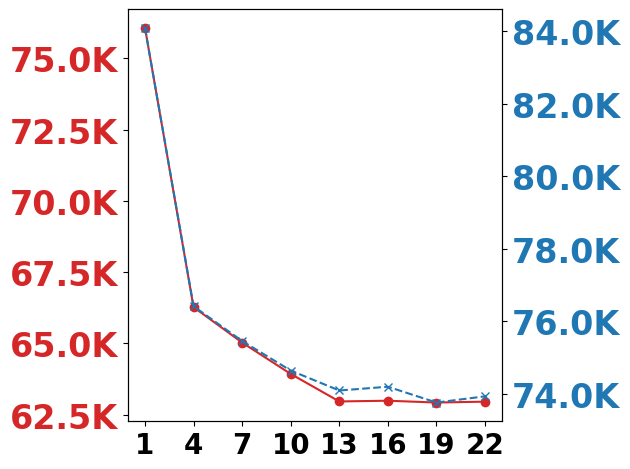

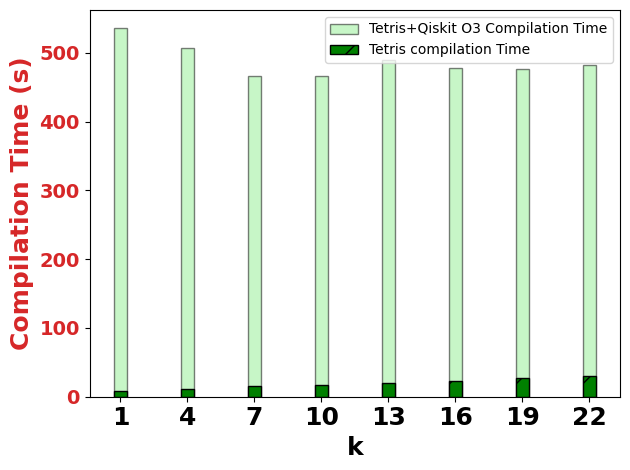

[21.516775369644165, 30.886056184768677, 39.0764741897583, 44.18923544883728, 50.741825342178345, 59.13712024688721, 69.8322422504425, 78.36997652053833]
[1415.7430849075317, 1174.5668416023254, 1252.368447303772, 1108.102837562561, 1128.1227276325226, 1104.8246405124664, 1263.3433983325958, 1124.5788793563843]


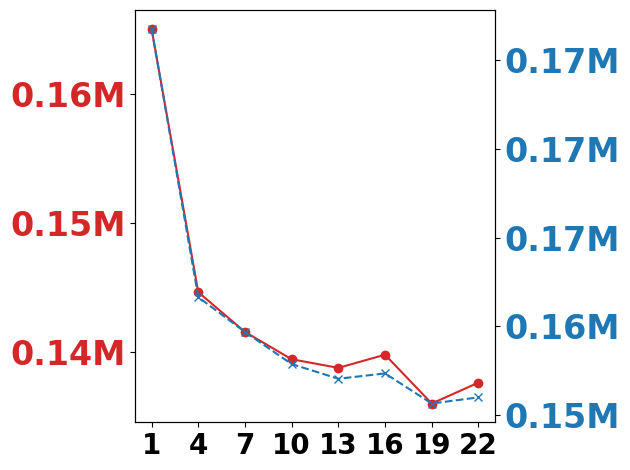

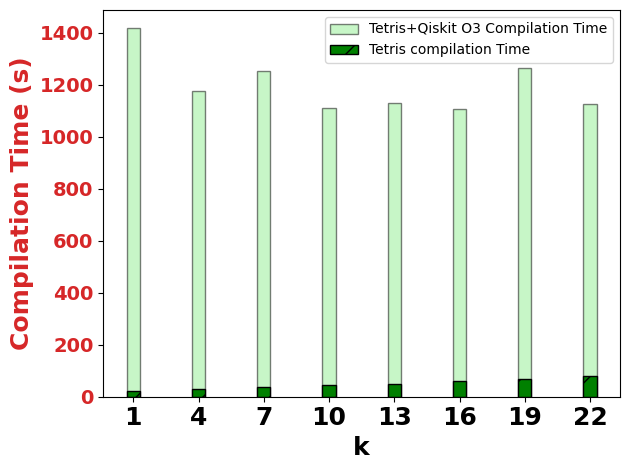

[27.404250144958496, 39.045263051986694, 47.18945026397705, 56.11584711074829, 70.19461417198181, 77.3546712398529, 91.3086929321289, 100.04699897766113]
[1757.6054418087006, 1472.3470618724823, 1605.8646235466003, 1362.1621582508087, 1371.022374868393, 1486.5178861618042, 1382.1838903427124, 1480.3502442836761]


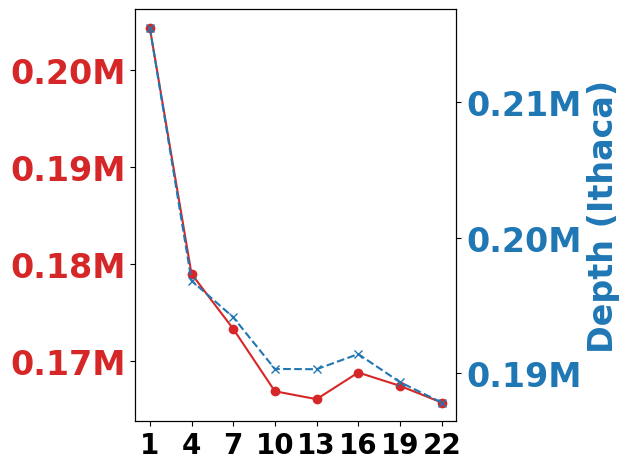

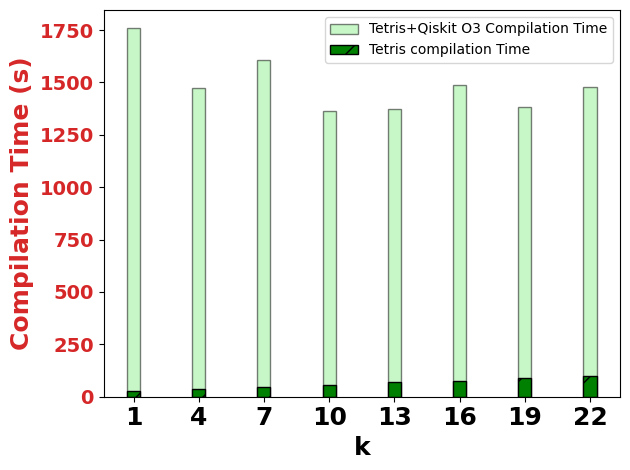

In [ ]:
ks = [1, 4, 7, 10, 13, 16, 19, 22]
ithaca_cnots = [0 for k in ks]
ithaca_depth = [0 for k in ks]
ithaca_latency1 = [0 for k in ks]
ithaca_latency2 = [0 for k in ks]
print(ithaca_latency1)
print(ithaca_latency2)
for bid in range(6):
    for i, k in enumerate(ks):
        ithaca_data = pickle_load(f'runs_final/ablation/ithaca_k_{k}.pickle')
        ithaca_cnots[i] = ithaca_data[bid][1]['CNOT']
        ithaca_depth[i] = ithaca_data[bid][1]['Depth']
        ithaca_latency1[i] = ithaca_data[bid][1]['latency1']
        ithaca_latency2[i] = ithaca_data[bid][1]['latency2']

    print(ithaca_latency1)
    print(ithaca_latency2)
    fig, ax1 = plt.subplots()

    color = 'tab:red'
    # ax1.set_xlabel('k', fontsize=18, fontweight='bold')
    if bid == 0:
        ax1.set_ylabel('CNOTs (Ithaca)', color=color, fontsize=24, fontweight='bold')
    ax1.plot(range(len(ks)), ithaca_cnots, color=color, label='CNOT', linestyle='-', marker='o')
    ax1.tick_params(axis='y', labelcolor=color, labelsize=24)
    plt.gca().yaxis.set_major_formatter(FuncFormatter(format_thousands2))

    ax2 = ax1.twinx()  
    color = 'tab:blue'
    if bid == 5:
        ax2.set_ylabel('Depth (Ithaca)', color=color, fontsize=24, fontweight='bold')  
    ax2.plot(range(len(ks)), ithaca_depth, color=color, label='Depth', linestyle='--', marker='x')
    ax2.tick_params(axis='y', labelcolor=color, labelsize=24)
    plt.gca().yaxis.set_major_formatter(FuncFormatter(format_thousands2))
    # Set x-axis ticks at equally spaced intervals
    ax1.set_xticks(range(len(ks)))
    ax1.set_xticklabels([str(k) for k in ks], fontsize=20, fontweight='bold')

    ytick_labels = ax1.get_yticklabels()
    for label in ytick_labels:
        label.set_fontweight('bold')
    ytick_labels = ax2.get_yticklabels()
    for label in ytick_labels:
        label.set_fontweight('bold')
    fig.tight_layout()  
    # plt.title('Ithaca CNOT and Depth')
    plt.savefig(f'exp_figs/k_performance_mole{bid}.pdf')
    plt.show()

    # Plotting the second figure for Sycamore
    fig, ax1 = plt.subplots()

    color = 'tab:red'
    ax1.set_xlabel('k', fontsize=18, fontweight='bold')
    ax1.set_ylabel('Compilation Time (s)', color=color, fontsize=18, fontweight='bold')
    bar1_plot = ax1.bar(range(len(ks)), ithaca_latency2, width, label='Tetris+Qiskit O3 Compilation Time',color='lightgreen',edgecolor='black',alpha=0.5)

    bar4_plot = ax1.bar(range(len(ks)), ithaca_latency1, width, label='Tetris compilation Time',color='g',edgecolor='black', hatch='/')

    ax1.tick_params(axis='y', labelcolor=color, labelsize=14)
    # plt.gca().yaxis.set_major_formatter(FuncFormatter(format_thousands))

    # Set x-axis ticks at equally spaced intervals
    ax1.set_xticks(range(len(ks)))
    ax1.set_xticklabels([str(k) for k in ks], fontsize=18, fontweight='bold')

    ytick_labels = ax1.get_yticklabels()
    for label in ytick_labels:
        label.set_fontweight('bold')
    plt.legend()
    fig.tight_layout()  
    # plt.title('Sycamore CNOT and Depth')
    plt.savefig(f'exp_figs/k_latency_mole{bid}.pdf')
    plt.show()

# Noise Simulator

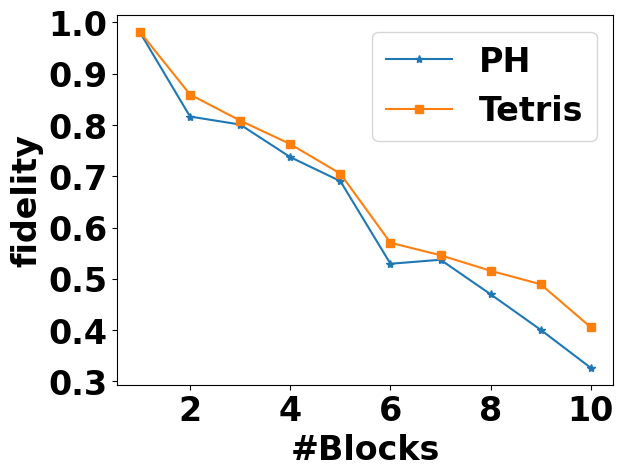

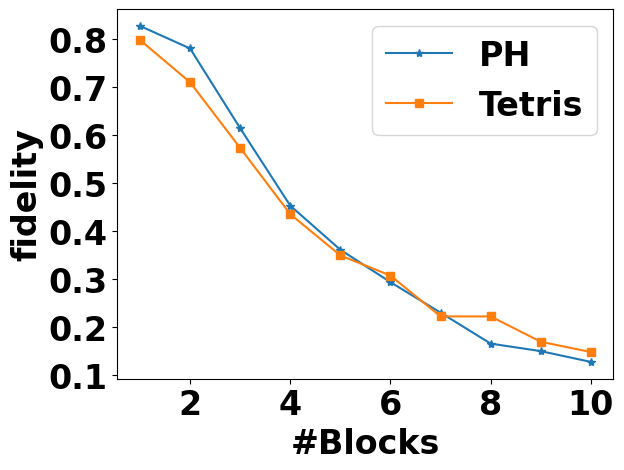

In [ ]:
moles = ['LiH', 'BeH2', 'CH4', 'MgH2', 'LiCl', 'CO2']
for i in [0, 5]:
    X, Y_ph, Y_tetris = pickle_load(f'runs_final/noise_simulator/data_{i}.pickle')
    fig, ax = plt.subplots()
    plt.plot(X, Y_ph, label='PH', marker='*')
    plt.plot(X, Y_tetris, label='Tetris', marker='s')
    ytick_labels = ax.get_yticklabels()
    for label in ytick_labels:
        label.set_fontweight('bold')
        label.set_fontsize(24)
    xtick_labels = ax.get_xticklabels()
    for label in xtick_labels:
        label.set_fontweight('bold')
        label.set_fontsize(24)

    # Adding labels
    plt.xlabel('#Blocks', fontsize=24, fontweight='bold')
    plt.ylabel('fidelity', fontsize=24, fontweight='bold')
    # plt.title('Plot of fidelity_ and Y_tetris')
    legend = plt.legend(fontsize=24)
    for text in legend.get_texts():
        text.set_fontweight('bold')

    plt.savefig(f'exp_figs/fidelity_{moles[i]}.pdf')

    # Display plot
    plt.show()


[('LiH', {'CNOT_tketO2': 10646, 'Single_tketO2': 1347, 'Total_tketO2': 11993, 'Depth_tketO2': 8360, 'n_qubits': 12, 'CNOT': 13641, 'Single': 3564, 'Total': 17205, 'Depth': 9726, 'qasm': 'OPENQASM 2.0;\ninclude "qelib1.inc";\n\nqreg q[12];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[0];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[1];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[2];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[3];\nu3(0.5*pi,0.0*pi,1.0*pi) q[5];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[6];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[7];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[8];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[9];\nu3(0.5*pi,0.0*pi,1.0*pi) q[11];\ncx q[5],q[4];\ncx q[11],q[10];\ncx q[4],q[3];\ncx q[10],q[9];\nu3(0.0*pi,-0.5*pi,0.8184713375796178*pi) q[3];\nu3(0.0*pi,-0.5*pi,0.8184713375796178*pi) q[9];\ncx q[4],q[3];\ncx q[10],q[9];\nu3(3.5*pi,-0.5*pi,0.5*pi) q[3];\ncx q[5],q[4];\nu3(3.5*pi,-0.5*pi,0.5*pi) q[9];\ncx q[11],q[10];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[3];\nu3(0.5*pi,0.0*pi,1.0*pi) q[4];\nu3(0.5*pi,0.0*pi,1.0*pi) q[5];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[9];\nu3(0.5*pi,0.0

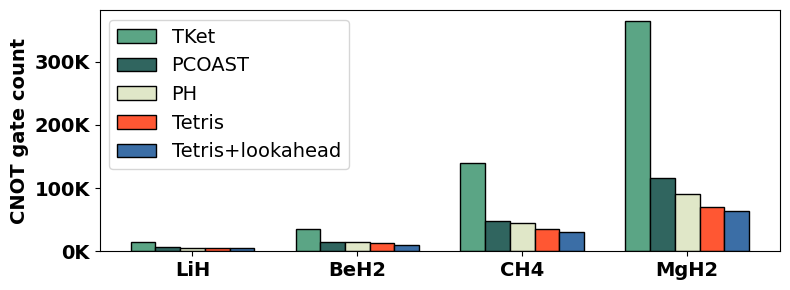

In [ ]:
import numpy as np
x_values = np.array(['LiH', 'BeH2', 'CH4', 'MgH2'])  # X-axis values
n = len(x_values)
TKet_data_list = pickle_load(f'runs_final/jordan_wigner/tket_data.pickle')[:n]
PH_data_list = pickle_load(f'runs_final/jordan_wigner/PH_data.pickle')[:n]
Tetris_data_list = pickle_load(f'runs_final/jordan_wigner/Tetris_data.pickle')[:n]
Tetris_lh_data_list = pickle_load(f'runs_final/jordan_wigner/Tetris_lookahead_data.pickle')[:n]

tk_cnots = [13895, 34719, 139228, 363524]
# tk_cnots = [10646, 25789, 104888, 245992]
ph_cnots = []
tetris_cnots = []
tetris_lh_cnots = []
print(TKet_data_list)
for i, (tk_data, ph_data, tetris_data, tetris_lh_data) in enumerate(zip(TKet_data_list, PH_data_list, Tetris_data_list, Tetris_lh_data_list)):
    mole, tk = tk_data
    mole, ph = ph_data
    mole, tetris = tetris_data
    mole, tetris_lh = tetris_lh_data
    
    # tk_cnots.append(tk['CNOT'])
    ph_cnots.append(ph['CNOT'])
    tetris_cnots.append(tetris['CNOT'])
    tetris_lh_cnots.append(tetris_lh['CNOT'])


pcoast_cnots = []
for n_qubits in [12, 14, 18, 22]:
    metric = pickle_load(f'../pcoast/experiments/pcoast_{n_qubits}.pickle')
    pcoast_cnots.append(metric['CNOT'])

width = 0.15  # Width of each bar

# Create a figure and axis
fig, ax = plt.subplots(figsize=(8, 3))

# Set the bar positions
x_positions = np.arange(len(x_values))

# Create the bars
# Custom colors for bars (in hexadecimal format)
colors = ['#5ba585', '#30655f', '#e0e7c8', '#ff5733', '#3b6ea6']
bar0_plot = ax.bar(x_positions - width * 2, tk_cnots, width, label='TKet',color=colors[0],edgecolor='black')
bar1_plot = ax.bar(x_positions - width    , pcoast_cnots, width, label='PCOAST',color=colors[1],edgecolor='black')
bar1_plot = ax.bar(x_positions            , ph_cnots, width, label='PH',color=colors[2],edgecolor='black')
bar2_plot = ax.bar(x_positions + width    , tetris_cnots, width, label='Tetris',color=colors[3],edgecolor='black')
bar3_plot = ax.bar(x_positions + width * 2, tetris_lh_cnots, width, label='Tetris+lookahead',color=colors[4],edgecolor='black')

# Set the x-axis labels
ax.set_xticks(x_positions)
ax.set_xticklabels(x_values, fontsize=14, fontweight='bold')  # Set font size for x-axis tick labels

# Set the y-axis label font size
ax.set_ylabel('CNOT gate count', fontsize=14,fontweight='bold')  # Set font size for y-axis label
plt.gca().yaxis.set_major_formatter(FuncFormatter(format_thousands))

# Set font size for y-axis tick labels
ax.tick_params(axis='y', labelsize=14)
ytick_labels = ax.get_yticklabels()
for label in ytick_labels:
    label.set_fontweight('bold')

# Add labels and a legend
# ax.set_xlabel('Real Molecules with JW')

# ax.set_title('CX Gate Cancel Ratio',fontsize = 15)
ax.legend(fontsize=14)
for text in legend.get_texts():
    text.set_fontweight('bold')

# Show the plot
plt.tight_layout()
plt.savefig('exp_figs/more_baselines.pdf')
plt.show()

[('LiH', {'CNOT_tketO2': 10646, 'Single_tketO2': 1347, 'Total_tketO2': 11993, 'Depth_tketO2': 8360, 'n_qubits': 12, 'CNOT': 13641, 'Single': 3564, 'Total': 17205, 'Depth': 9726, 'qasm': 'OPENQASM 2.0;\ninclude "qelib1.inc";\n\nqreg q[12];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[0];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[1];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[2];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[3];\nu3(0.5*pi,0.0*pi,1.0*pi) q[5];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[6];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[7];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[8];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[9];\nu3(0.5*pi,0.0*pi,1.0*pi) q[11];\ncx q[5],q[4];\ncx q[11],q[10];\ncx q[4],q[3];\ncx q[10],q[9];\nu3(0.0*pi,-0.5*pi,0.8184713375796178*pi) q[3];\nu3(0.0*pi,-0.5*pi,0.8184713375796178*pi) q[9];\ncx q[4],q[3];\ncx q[10],q[9];\nu3(3.5*pi,-0.5*pi,0.5*pi) q[3];\ncx q[5],q[4];\nu3(3.5*pi,-0.5*pi,0.5*pi) q[9];\ncx q[11],q[10];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[3];\nu3(0.5*pi,0.0*pi,1.0*pi) q[4];\nu3(0.5*pi,0.0*pi,1.0*pi) q[5];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[9];\nu3(0.5*pi,0.0

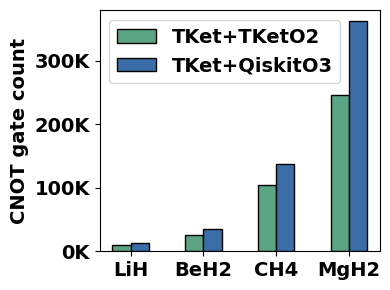

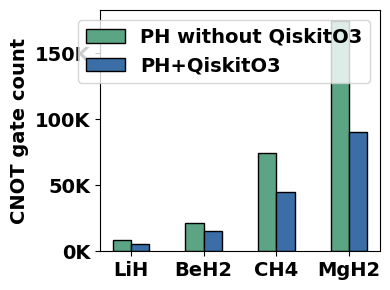

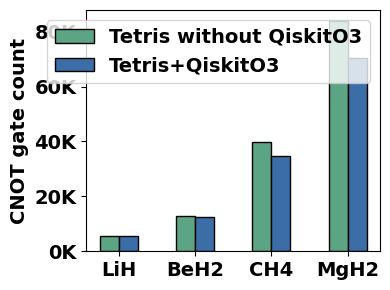

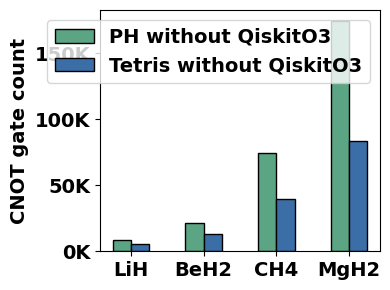

In [29]:
import numpy as np
x_values = np.array(['LiH', 'BeH2', 'CH4', 'MgH2'])  # X-axis values
n = len(x_values)
TKet_data_list = pickle_load(f'runs_final/jordan_wigner/tket_data.pickle')[:n]

# tk_cnots = [13895, 34719, 139228, 363524]
tk_tketo2_cnots = []
tk_qiskito3_cnots = []
# tk_cnots = [10646, 25789, 104888, 245992]
print(TKet_data_list)
for i, tk_data in enumerate(TKet_data_list):
    mole, tk = tk_data
    
    tk_tketo2_cnots.append(tk['CNOT_tketO2'])
    tk_qiskito3_cnots.append(tk['CNOT'])

print(tk_tketo2_cnots)
print(tk_qiskito3_cnots)
PH_data_list = pickle_load(f'runs_final/jordan_wigner/PH_data.pickle')[:n]
PH_data_without_list = pickle_load(f'runs_final/jordan_wigner/PH_data_without_qiskitO3.pickle')[:n]
Tetris_data_list = pickle_load(f'runs_final/jordan_wigner/Tetris_data.pickle')[:n]
Tetris_data_without_list = pickle_load(f'runs_final/jordan_wigner/Tetris_data_without_qiskitO3.pickle')[:n]
ph_cnots = []
ph_cnots_without = []
tetris_cnots = []
tetris_cnots_without = []

for i in range(n):
    ph_cnots.append(PH_data_list[i][1]['CNOT'])
    ph_cnots_without.append(PH_data_without_list[i][1]['CNOT'])
    tetris_cnots.append(Tetris_data_list[i][1]['CNOT'])
    tetris_cnots_without.append(Tetris_data_without_list[i][1]['CNOT'])
def plot_with_without_qiskitO3(name_without, name_with, filename, data1, data2):
    width = 0.25  # Width of each bar

    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(4, 3))

    # Set the bar positions
    x_positions = np.arange(len(x_values))

    # Create the bars
    # Custom colors for bars (in hexadecimal format)
    colors = ['#5ba585', '#30655f', '#e0e7c8', '#ff5733', '#3b6ea6']
    bar0_plot = ax.bar(x_positions - width * 0.5, data1, width, label=name_without,color=colors[0],edgecolor='black')
    bar3_plot = ax.bar(x_positions + width * 0.5, data2, width, label=name_with,color=colors[4],edgecolor='black')

    # Set the x-axis labels
    ax.set_xticks(x_positions)
    ax.set_xticklabels(x_values, fontsize=14, fontweight='bold')  # Set font size for x-axis tick labels

    # Set the y-axis label font size
    ax.set_ylabel('CNOT gate count', fontsize=14,fontweight='bold')  # Set font size for y-axis label
    plt.gca().yaxis.set_major_formatter(FuncFormatter(format_thousands))

    # Set font size for y-axis tick labels
    ax.tick_params(axis='y', labelsize=14)
    ytick_labels = ax.get_yticklabels()
    for label in ytick_labels:
        label.set_fontweight('bold')

    # Add labels and a legend
    # ax.set_xlabel('Real Molecules with JW')

    # ax.set_title('CX Gate Cancel Ratio',fontsize = 15)
    legend = ax.legend(fontsize=14)
    for text in legend.get_texts():
        text.set_fontweight('bold')

    # Show the plot
    plt.tight_layout()
    plt.savefig(f'exp_figs/{filename}.pdf')
    plt.show()

plot_with_without_qiskitO3('TKet+TKetO2', 'TKet+QiskitO3', 'tket_analysis', tk_tketo2_cnots, tk_qiskito3_cnots)
plot_with_without_qiskitO3('PH without QiskitO3', 'PH+QiskitO3', 'PH_analysis', ph_cnots_without, ph_cnots)
plot_with_without_qiskitO3('Tetris without QiskitO3', 'Tetris+QiskitO3', 'Tetris_analysis', tetris_cnots_without, tetris_cnots)
plot_with_without_qiskitO3('PH without QiskitO3', 'Tetris without QiskitO3', 'PH_Tetris_analysis', ph_cnots_without, tetris_cnots_without)

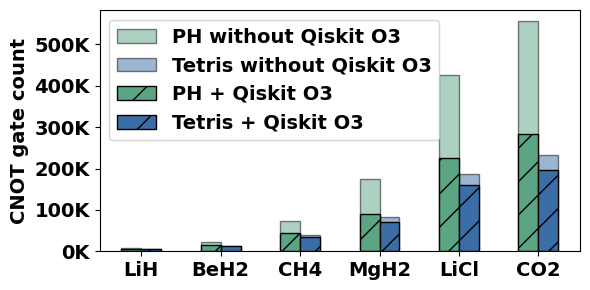

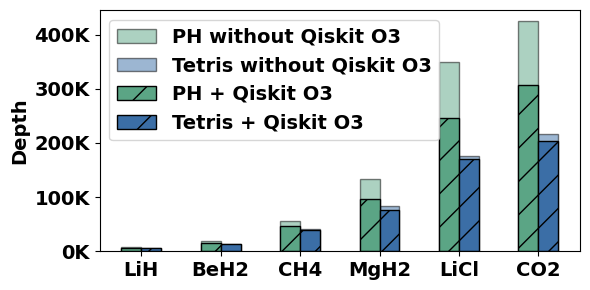

In [31]:
x_values = np.array(['LiH', 'BeH2', 'CH4', 'MgH2', 'LiCl', 'CO2'])  # X-axis values
n = len(x_values)
PH_data_list = pickle_load(f'runs_final/jordan_wigner/PH_data.pickle')[:n]
PH_data_without_list = pickle_load(f'runs_final/jordan_wigner/PH_data_without_qiskitO3.pickle')[:n]
Tetris_data_list = pickle_load(f'runs_final/jordan_wigner/Tetris_lookahead_data.pickle')[:n]
Tetris_data_without_list = pickle_load(f'runs_final/jordan_wigner/Tetris_data_without_qiskitO3.pickle')[:n]
ph_cnots = []
ph_cnots_without = []
tetris_cnots = []
tetris_cnots_without = []
ph_depth = []
ph_depth_without = []
tetris_depth = []
tetris_depth_without = []

for i in range(n):
    ph_cnots.append(PH_data_list[i][1]['CNOT'])
    ph_cnots_without.append(PH_data_without_list[i][1]['CNOT'])
    tetris_cnots.append(Tetris_data_list[i][1]['CNOT'])
    tetris_cnots_without.append(Tetris_data_without_list[i][1]['CNOT'])
    ph_depth.append(PH_data_list[i][1]['Depth'])
    ph_depth_without.append(PH_data_without_list[i][1]['Depth'])
    tetris_depth.append(Tetris_data_list[i][1]['Depth'])
    tetris_depth_without.append(Tetris_data_without_list[i][1]['Depth'])


def plot_ph_tetris(data1, data2, data3, data4, ylabel, filename, name1, name2, name3, name4):
    width = 0.25  # Width of each bar

    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(6, 3))

    # Set the bar positions
    x_positions = np.arange(len(x_values))

    # Create the bars
    # Custom colors for bars (in hexadecimal format)
    colors = ['#5ba585', '#30655f', '#e0e7c8', '#ff5733', '#3b6ea6']
    bar0_plot = ax.bar(x_positions - width * 0.5, data1, width, label=name1,color=colors[0],edgecolor='black', alpha=0.5)
    bar1_plot = ax.bar(x_positions + width * 0.5, data2, width, label=name2,color=colors[4],edgecolor='black', alpha=0.5)
    bar2_plot = ax.bar(x_positions - width * 0.5, data3, width, label=name3,color=colors[0],edgecolor='black', hatch='/')
    bar3_plot = ax.bar(x_positions + width * 0.5, data4, width, label=name4,color=colors[4],edgecolor='black', hatch='/')

    # Set the x-axis labels
    ax.set_xticks(x_positions)
    ax.set_xticklabels(x_values, fontsize=14, fontweight='bold')  # Set font size for x-axis tick labels

    # Set the y-axis label font size
    ax.set_ylabel(ylabel, fontsize=14,fontweight='bold')  # Set font size for y-axis label
    plt.gca().yaxis.set_major_formatter(FuncFormatter(format_thousands))

    # Set font size for y-axis tick labels
    ax.tick_params(axis='y', labelsize=14)
    ytick_labels = ax.get_yticklabels()
    for label in ytick_labels:
        label.set_fontweight('bold')

    # Add labels and a legend
    # ax.set_xlabel('Real Molecules with JW')

    # ax.set_title('CX Gate Cancel Ratio',fontsize = 15)
    legend = ax.legend(fontsize=14)
    for text in legend.get_texts():
        text.set_fontweight('bold')

    # Show the plot
    plt.tight_layout()
    plt.savefig(f'exp_figs/{filename}.pdf')
    plt.show()

plot_ph_tetris(ph_cnots_without, tetris_cnots_without, ph_cnots, tetris_cnots, 'CNOT gate count', 'cnots_ph_tetris_without_qiskito3', 'PH without Qiskit O3', 'Tetris without Qiskit O3', 'PH + Qiskit O3', 'Tetris + Qiskit O3')
plot_ph_tetris(ph_depth_without, tetris_depth_without, ph_depth, tetris_depth, 'Depth', 'depth_ph_tetris_without_qiskito3', 'PH without Qiskit O3', 'Tetris without Qiskit O3', 'PH + Qiskit O3', 'Tetris + Qiskit O3')

In [28]:
mole_id = 2
print(PH_data_without_list[mole_id][1]['PH_cx_count'])
print(PH_data_without_list[mole_id][1]['PH_swap_count'])
print(PH_data_without_list[mole_id][1]['CNOT'])
print(PH_data_without_list[mole_id][1]['Depth'])
print(Tetris_data_without_list[mole_id][1]['tetris_cx_count'])
print(Tetris_data_without_list[mole_id][1]['tetris_swap_count'])
print(Tetris_data_without_list[mole_id][1]['CNOT'])
print(Tetris_data_without_list[mole_id][1]['Depth'])

73488
297
74379
55179
73680
1615
78525
57952


[('LiH', {'CNOT_tketO2': 10646, 'Single_tketO2': 1347, 'Total_tketO2': 11993, 'Depth_tketO2': 8360, 'n_qubits': 12, 'CNOT': 13641, 'Single': 3564, 'Total': 17205, 'Depth': 9726, 'qasm': 'OPENQASM 2.0;\ninclude "qelib1.inc";\n\nqreg q[12];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[0];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[1];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[2];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[3];\nu3(0.5*pi,0.0*pi,1.0*pi) q[5];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[6];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[7];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[8];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[9];\nu3(0.5*pi,0.0*pi,1.0*pi) q[11];\ncx q[5],q[4];\ncx q[11],q[10];\ncx q[4],q[3];\ncx q[10],q[9];\nu3(0.0*pi,-0.5*pi,0.8184713375796178*pi) q[3];\nu3(0.0*pi,-0.5*pi,0.8184713375796178*pi) q[9];\ncx q[4],q[3];\ncx q[10],q[9];\nu3(3.5*pi,-0.5*pi,0.5*pi) q[3];\ncx q[5],q[4];\nu3(3.5*pi,-0.5*pi,0.5*pi) q[9];\ncx q[11],q[10];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[3];\nu3(0.5*pi,0.0*pi,1.0*pi) q[4];\nu3(0.5*pi,0.0*pi,1.0*pi) q[5];\nu3(0.5*pi,-0.5*pi,0.5*pi) q[9];\nu3(0.5*pi,0.0

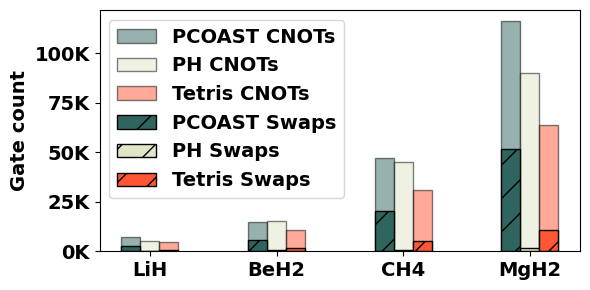

In [34]:
import numpy as np
x_values = np.array(['LiH', 'BeH2', 'CH4', 'MgH2'])  # X-axis values
n = len(x_values)
PH_data_list = pickle_load(f'runs_final/jordan_wigner/PH_data.pickle')[:n]
Tetris_data_list = pickle_load(f'runs_final/jordan_wigner/Tetris_data.pickle')[:n]
Tetris_lh_data_list = pickle_load(f'runs_final/jordan_wigner/Tetris_lookahead_data.pickle')[:n]

ph_cnots = []
tetris_cnots = []
tetris_lh_cnots = []
ph_lcnots = []
tetris_lh_lcnots = []
ph_swaps = []
tetris_lh_swaps = []
print(TKet_data_list)
for i, (ph_data, tetris_data, tetris_lh_data) in enumerate(zip(PH_data_list, Tetris_data_list, Tetris_lh_data_list)):
    mole, ph = ph_data
    mole, tetris = tetris_data
    mole, tetris_lh = tetris_lh_data
    
    ph_cnots.append(ph['CNOT'])
    tetris_cnots.append(tetris['CNOT'])
    tetris_lh_cnots.append(tetris_lh['CNOT'])
    ph_lcnots.append(ph['PH_cx_count'])
    ph_swaps.append(ph['PH_swap_count'] * 3)
    tetris_lh_lcnots.append(tetris_lh['tetris_cx_count'])
    tetris_lh_swaps.append(tetris_lh['tetris_swap_count'] * 3)
print(tetris_lh_cnots)

pcoast_cnots = []
pcoast_lcnots = []
pcoast_swaps = []
for n_qubits in [12, 14, 18, 22]:
    metric = pickle_load(f'../pcoast/experiments/pcoast_{n_qubits}.pickle')
    pcoast_cnots.append(metric['CNOT'])
    pcoast_lcnots.append(2 * metric['num_rotxy'])
    pcoast_swaps.append((metric['CNOT'] - 2 * metric['num_rotxy']))

width = 0.15  # Width of each bar

# Create a figure and axis
fig, ax = plt.subplots(figsize=(6, 3))

# Set the bar positions
x_positions = np.arange(len(x_values))

# Create the bars
# Custom colors for bars (in hexadecimal format)
colors = ['#5ba585', '#30655f', '#e0e7c8', '#ff5733', '#3b6ea6']
ax.bar(x_positions - width, pcoast_cnots, width, color=colors[1], edgecolor='black', alpha=0.5, label='PCOAST CNOTs')
ax.bar(x_positions        , ph_cnots, width, color=colors[2], edgecolor='black', alpha=0.5, label='PH CNOTs')
ax.bar(x_positions + width, tetris_lh_cnots, width, color=colors[3], edgecolor='black', alpha=0.5, label='Tetris CNOTs')
# ax.bar(np.array(range(len(benchmarks))) + width, data[:, 2], width, color=colors2[2], edgecolor='black', alpha=0.5, label=f'{experiments[2]} + Qiskit O3')
if (True):
    ax.bar(x_positions - width, pcoast_swaps, width, color=colors[1], edgecolor='black', hatch='/', label=f'PCOAST Swaps')
    ax.bar(x_positions        , ph_swaps, width, color=colors[2], edgecolor='black', hatch='/', label=f'PH Swaps')
    ax.bar(x_positions + width, tetris_lh_swaps, width, color=colors[3], edgecolor='black', hatch='/', label=f'Tetris Swaps')
else:
    ax.bar(x_positions - width, pcoast_lcnots, width, color=colors[1], edgecolor='black', hatch='/', label=f'PCOAST Logical CNOTs')
    ax.bar(x_positions        , ph_lcnots, width, color=colors[2], edgecolor='black', hatch='/', label=f'PH Logical CNOTs')
    ax.bar(x_positions + width, tetris_lh_lcnots, width, color=colors[3], edgecolor='black', hatch='/', label=f'Tetris Logical CNOTs')

# Set the x-axis labels
ax.set_xticks(x_positions)
ax.set_xticklabels(x_values, fontsize=14, fontweight='bold')  # Set font size for x-axis tick labels

# Set the y-axis label font size
ax.set_ylabel('Gate count', fontsize=14,fontweight='bold')  # Set font size for y-axis label
plt.gca().yaxis.set_major_formatter(FuncFormatter(format_thousands))

# Set font size for y-axis tick labels
ax.tick_params(axis='y', labelsize=14)
ytick_labels = ax.get_yticklabels()
for label in ytick_labels:
    label.set_fontweight('bold')

# Add labels and a legend
# ax.set_xlabel('Real Molecules with JW')

# ax.set_title('CX Gate Cancel Ratio',fontsize = 15)
legend = ax.legend(fontsize=14)
for text in legend.get_texts():
    text.set_fontweight('bold')

# Show the plot
plt.tight_layout()
plt.savefig('exp_figs/pcoast_breakdown.pdf')
plt.show()